## Advanced Lane Finding
[![Udacity - Self-Driving Car NanoDegree](https://s3.amazonaws.com/udacity-sdc/github/shield-carnd.svg)](http://www.udacity.com/drive)
![Lanes Image](./output_images/final_output.jpg)

The Project
---

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


Let's talk about each step one by one and how I implemented it!

Note: All output images can be found at './output_images'

# First step - Camera Calibration

In this step, I fetch object points using real pictures of chessboard and derive chessboard corners from same. Then I use the derived object points and map them onto 2-D image points. Finally, I use cv2.calibrateCamera() method to retrieve the camera matrix and distortion coefficients. This code resides at './camera_cal/camera_calibration.ipynb' and values for mtx and dist have been saved in a pickle file to be retrieved in the code below.

In [135]:
import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

dist_pickle = pickle.load(open("camera_cal/calibration_pickle.p", "rb" ))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

print("Camera matrix: ", mtx)
print("Distortion coefficient: ", dist)

Camera matrix:  [[1.15777818e+03 0.00000000e+00 6.67113857e+02]
 [0.00000000e+00 1.15282217e+03 3.86124583e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Distortion coefficient:  [[-0.24688507 -0.02373155 -0.00109831  0.00035107 -0.00259868]]


# Second step - Apply distortion correction to raw images
In this step, the camera matrix and distortion coefficients are used to undistort the raw images.

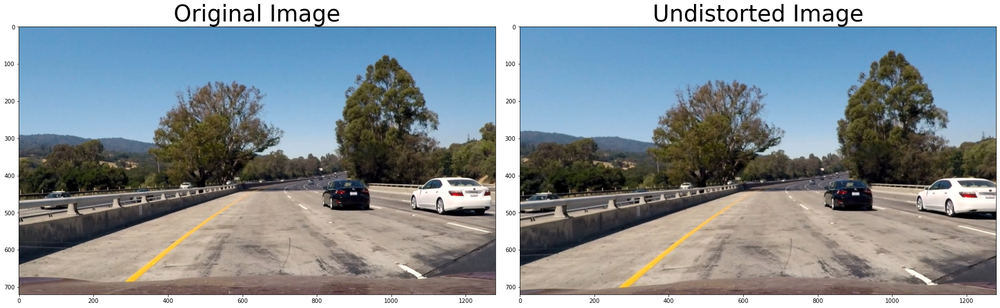

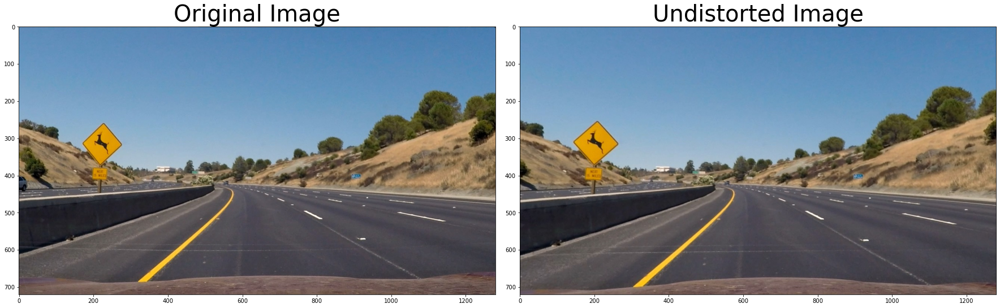

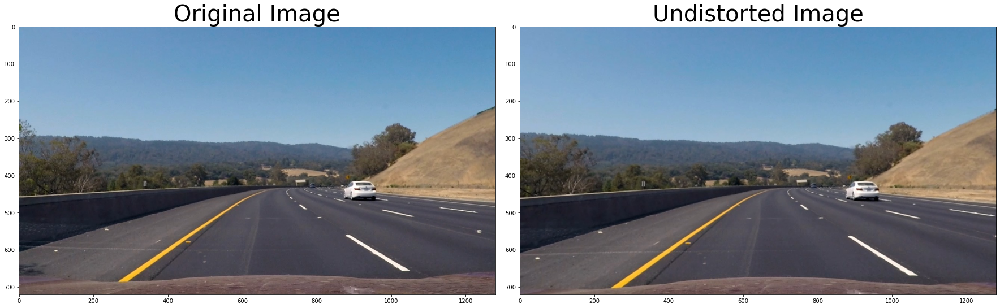

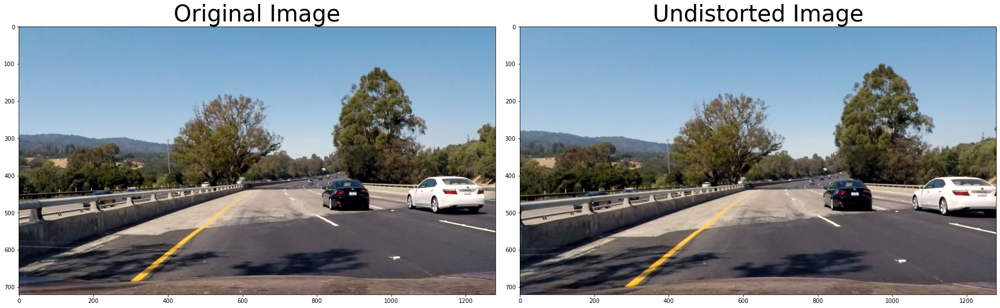

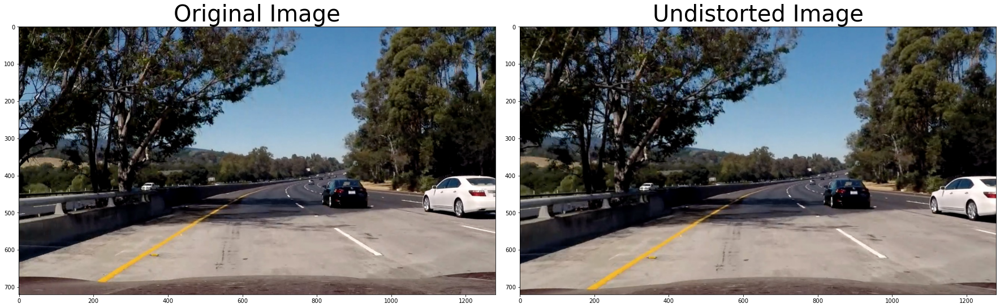

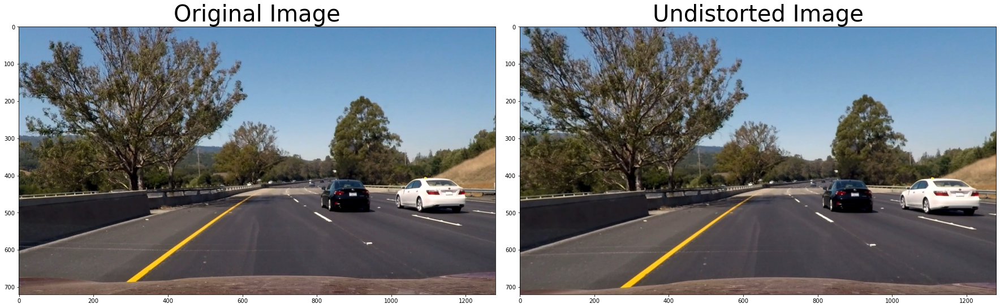

In [136]:
images = glob.glob("./test_images/test*.jpg")

for idx,fname in enumerate(images):
    img = mpimg.imread(fname)
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    #undistort the images
    undistorted_img = cv2.undistort(img,mtx,dist,None,mtx)

    write_name = "./output_images/undistorted" + str(idx) + ".jpg"
    cv2.imwrite(write_name,undistorted_img)

    
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(undistorted_img)
    ax2.set_title('Undistorted Image', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


# Third step - Create thresholded binary image

In this step, gradient values and color spaces are used to fetch a thresholded binary image which uses HLS and HSV channel filtration and a combined threshold is applied.

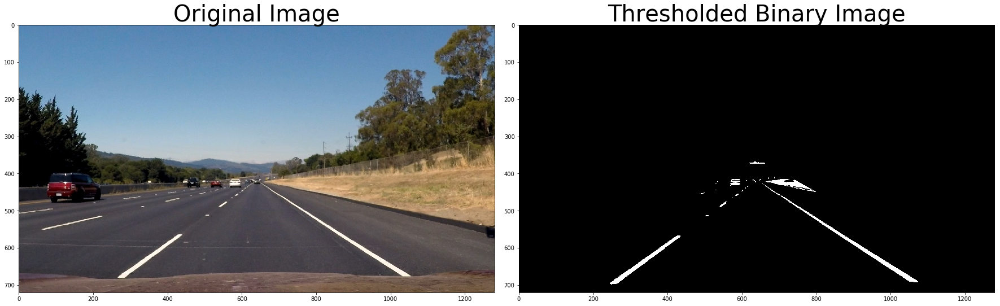

In [23]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=5, thresh=(0, 255)):
    # Calculate directional gradient
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    if orient=='x' :
        sobel = cv2.Sobel(gray, cv2.CV_64F,0,1,ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F,1,0,ksize=sobel_kernel)
    
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Apply threshold
    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >=thresh[0]) & (scaled_sobel <= thresh[1])] = 1
     
    return grad_binary

def mag_thresh(img, sobel_kernel=5,mag_thresh=(0, 255)):
    # Calculate gradient magnitude
    
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)    
    
    # 2) Take the gradient in x and y separately
    
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0)
    
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1)
    
    # 3) Calculate the magnitude 
    
    magnitude_sobel = np.sqrt((sobelx**2)+(sobely**2))
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    
    scaled_sobel = np.uint8(255*magnitude_sobel/np.max(magnitude_sobel))
    
    # 5) Create a binary mask where mag thresholds are met
    binary_sobel = np.zeros_like(scaled_sobel)
    
    binary_sobel[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    
    # Apply threshold
    mag_binary=binary_sobel
    return mag_binary

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0, ksize=sobel_kernel)
    
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the x and y gradients
    
    abs_sobelx=np.absolute(sobelx)
    
    abs_sobely = np.absolute(sobely)
    
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    
    direction = np.arctan2(abs_sobely,abs_sobelx)
    direction = np.absolute(direction)
    # 5) Create a binary mask where direction thresholds are met
    
    binarymask = np.zeros_like(direction)
    
    binarymask[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    
    # 6) Return this mask as your binary_output image
    binary_output = binarymask 
    
    
    return binary_output

def image_preprocessing(img):
    img = cv2.undistort(img, mtx,dist, None, mtx)
    
    # convert to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    height, width = gray.shape
    
    # apply gradient threshold on the horizontal gradient
    sx_binary = abs_sobel_thresh(img,orient='x',thresh=(11,210))
    
    # apply gradient direction threshold so that only edges closer to vertical are detected.
    dir_binary = dir_threshold(img, thresh=(np.pi/6, np.pi/2))
    
    # combine the gradient and direction thresholds.
    combined_condition = ((sx_binary == 1) & (dir_binary == 1))
    
    # R & G thresholds so that yellow lanes are detected well.
    color_threshold = 150
    R = img[:,:,0]
    G = img[:,:,1]
    color_combined = np.zeros_like(R)
    r_g_condition = (R > color_threshold) & (G > color_threshold)
    
    
    # color channel thresholds
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    L = hls[:,:,1]
    
    # S channel performs well for detecting bright yellow and white lanes
    s_thresh = (100, 255)
    s_condition = (S > s_thresh[0]) & (S <= s_thresh[1])
    
    # We put a threshold on the L channel to avoid pixels which have shadows and as a result darker.
    l_thresh = (120, 255)
    l_condition = (L > l_thresh[0]) & (L <= l_thresh[1])

    # combine all the thresholds
    # A pixel should either be a yellowish or whiteish
    # And it should also have a gradient, as per our thresholds
    color_combined[(r_g_condition & l_condition) & (s_condition | combined_condition)] = 1
    
    # apply the region of interest mask
    mask = np.zeros_like(color_combined)
    region_of_interest_vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
    thresholded = cv2.bitwise_and(color_combined, mask)
    
    return thresholded


# code to get output
img = mpimg.imread('test_images/straight_lines2.jpg')

preprocessed_img = image_preprocessing(img)

write_name = "./output_images/preprocessed_img.jpg"
cv2.imwrite(write_name,preprocessed_img)


# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(preprocessed_img,cmap='gray')
ax2.set_title('Thresholded Binary Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    

# Fourth step - Apply a perspective transform

In this step, perspective transformation is applied to get the warped image which is a bird's eye view of the region of interest.

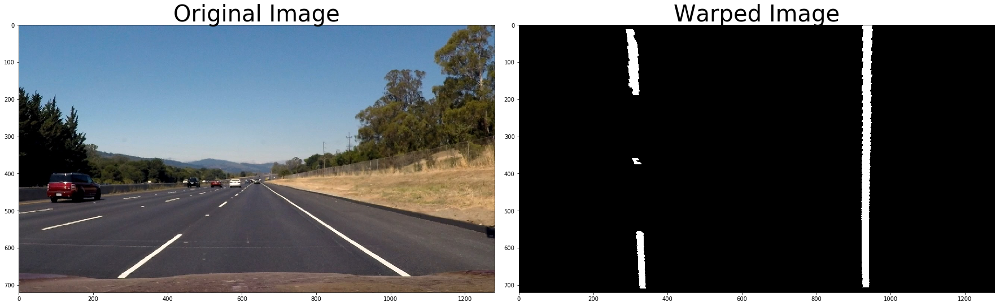

In [24]:
image_size = (img.shape[1],img.shape[0])
bottom_l = [200,725]
bottom_r = [1105, 725]
top_l = [565, 475]
top_r = [725, 475]
    
src = np.float32([bottom_l,bottom_r,top_r,top_l])
    
bottom_l = [325,725]
bottom_r = [925, 725]
top_l = [325, 2]
top_r = [925, 2]

dst = np.float32([bottom_l,bottom_r,top_r,top_l])
M = cv2.getPerspectiveTransform(src,dst)    
M_inv = cv2.getPerspectiveTransform(dst, src)

warped = cv2.warpPerspective(preprocessed_img,M,image_size,flags=cv2.INTER_LINEAR) 
 
write_name = "./output_images/warped.jpg"
cv2.imwrite(write_name,warped)
    
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(warped,cmap='gray')
ax2.set_title('Warped Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    

# Fifth step - Detect lane pixels and fit to find the lane boundary

In this step, histogram values are used to get the areas with high pixel values which are further used to detect the lane pixels and boundaries of left and right side of the lane lines.

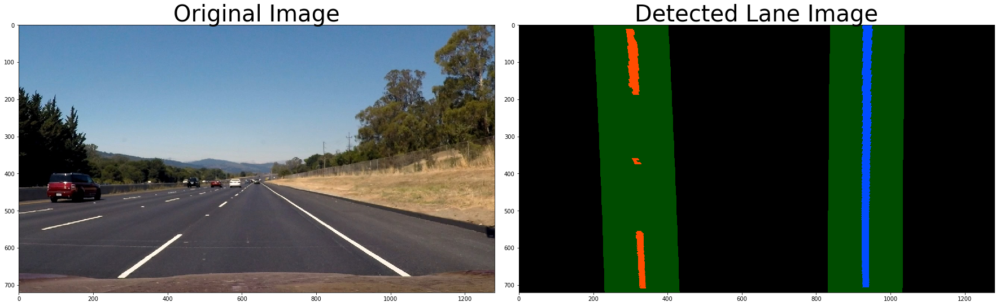

In [25]:
binary_warped = np.copy(warped)
# Take a histogram of the bottom half of the image
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
# Create an output image to draw on and visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50

# Set height of windows - based on nwindows above and image shape
    
window_height = np.int(binary_warped.shape[0]//nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated later for each window in nwindows
leftx_current = leftx_base
rightx_current = rightx_base

# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    ### Find the four below boundaries of the window ###
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
        
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),
    (win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),
    (win_xright_high,win_y_high),(0,255,0), 2) 
        
    ### Identify the nonzero pixels in x and y within the window ###
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
        
    ### If you found > minpix pixels, recenter next window ###
    ### (`right` or `leftx_current`) on their mean position ###
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices (previously was a list of lists of pixels)
try:
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
except ValueError:
    # Avoids an error if the above is not implemented fully
    pass

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]

left_fit = np.polyfit(lefty,leftx,2)
right_fit = np.polyfit(righty,rightx,2)
    

left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin)))
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))
   
# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]

ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
try:
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
except TypeError:
    # Avoids an error if `left` and `right_fit` are still none or incorrect
    print('The function failed to fit a line!')
    left_fitx = 1*ploty**2 + 1*ploty
    right_fitx = 1*ploty**2 + 1*ploty
    
## Visualization ##
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

## End visualization steps ##

# Define y-value where we want radius of curvature
# We'll choose the maximum y-value, corresponding to the bottom of the image
y_points = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
y_eval = np.max(y_points)
        
polyfit_left = np.polyfit(lefty, leftx, 2)
polyfit_right = np.polyfit(righty, rightx, 2)
leftx_predictions = polyfit_left[0]*y_points**2 + polyfit_left[1]*y_points + polyfit_left[2]
rightx_predictions = polyfit_right[0]*y_points**2 + polyfit_right[1]*y_points + polyfit_right[2]       

write_name = "./output_images/detected_lane.jpg"
cv2.imwrite(write_name,result)



# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Detected Lane Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    

# Sixth step - Determine the curvature of the lane and vehicle position with respect to center

In this step, the identified lane pixel values help to determine the radius of curvature and position of the vehicle from the center.

In [26]:
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# If no pixels were found return None
y_points = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
y_eval = np.max(y_points)

# Fit new polynomials to x,y in world space
fit_cr_left = np.polyfit(y_points*ym_per_pix, leftx_predictions*xm_per_pix, 2)
left_curverad = ((1 + (2*fit_cr_left[0]*y_eval*ym_per_pix + fit_cr_left[1])**2)**1.5) / np.absolute(2*fit_cr_left[0])
fit_cr_right = np.polyfit(y_points*ym_per_pix, rightx_predictions*xm_per_pix, 2)
right_curverad = ((1 + (2*fit_cr_right[0]*y_eval*ym_per_pix + fit_cr_right[1])**2)**1.5) / np.absolute(2*fit_cr_right[0])

average_curverad = (left_curverad+right_curverad)/2

text_curvature = "Radius of curvature: %.2f m" % average_curverad
print(text_curvature)

# compute the offset from the center
lane_center = (rightx_predictions[719] + leftx_predictions[719])/2
center_offset_pixels = abs(image_size[0]/2 - lane_center)
center_offset_mtrs = xm_per_pix*center_offset_pixels
text_offset = "Center offset: %.2f m" % center_offset_mtrs
print(text_offset)


Radius of curvature: 17066.62 m
Center offset: 0.05 m


# Seventh step - Inverse Transform

In this step, the identifed lane boundaries are mapped back onto the original image by using inversed perspective transform.

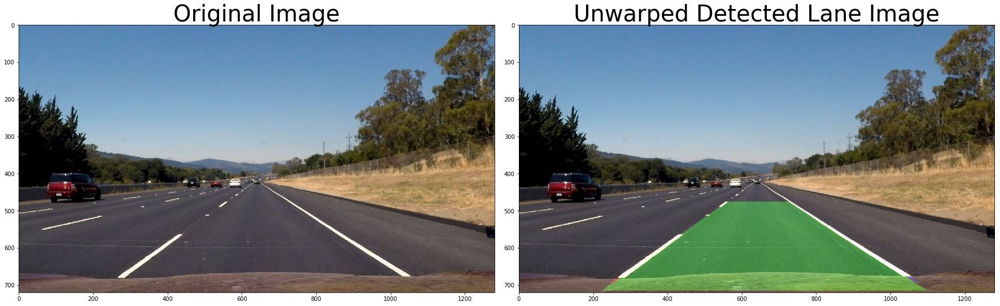

In [27]:

l_lane_window = np.array(np.transpose(np.vstack([leftx_predictions, y_points])))

r_lane_window = np.array(np.flipud(np.transpose(np.vstack([rightx_predictions, y_points]))))

line_points = np.vstack((l_lane_window, r_lane_window))

cv2.fillPoly(out_img, np.int_([line_points]), [0,255, 0])

unwarped = cv2.warpPerspective(out_img, M_inv, image_size , flags=cv2.INTER_LINEAR)

result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)

write_name = "./output_images/unwarped_Detected_lane_output.jpg"
cv2.imwrite(write_name,result)


# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Unwarped Detected Lane Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    

# Eighth step - Output visual display

In this step, the radius of curvature and offset from center values are visually displayed on the image

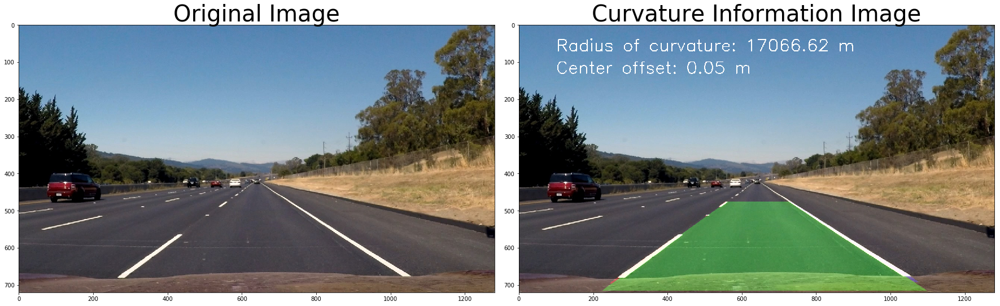

In [28]:
cv2.putText(result,text_curvature , (100, 70), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
cv2.putText(result, text_offset, (100, 130), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)

write_name = "./output_images/curvature_img.jpg"
cv2.imwrite(write_name,result)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)

ax2.imshow(result)
ax2.set_title('Curvature Information Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    

# Final pipeline video

In [29]:

# global variables to handle fresh frames
polyfit_left=None
polyfit_right=None

good_left_lines = []
good_right_lines = []

mean = 0


def measure_r_curvature(x_values):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # If no pixels were found return None
    y_points = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    y_eval = np.max(y_points)

    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(y_points*ym_per_pix, x_values*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    return curverad



def predict_lines(non_zeros_x, non_zeros_y, left_coordinates, right_coordinates, num_rows):
    """
        Given ncoordinates of non-zeros pixels and coordinates of non-zeros pixels within the sliding windows,
        this function generates a prediction for the lane line.
    """
    left_x = non_zeros_x[left_coordinates]
    left_y = non_zeros_y[left_coordinates]
    
    # If no pixels were found return None
    if(left_y.size == 0 or left_x.size == 0):
        return None, None

    # Fit the polynomial
    polyfit_left = np.polyfit(left_y, left_x, 2)

    right_x = non_zeros_x[right_coordinates]
    right_y = non_zeros_y[right_coordinates]
    
    # If no pixels were found return None
    if(right_y.size == 0 or right_x.size == 0):
        return None, None

    # Fit the polynomial
    polyfit_right = np.polyfit(right_y, right_x, 2)

    # If no pixels were found return None
    y_points = np.linspace(0, num_rows-1, num_rows)
    
    # Generate the lane lines from the polynomial fit
    left_x_predictions = polyfit_left[0]*y_points**2 + polyfit_left[1]*y_points + polyfit_left[2]
    right_x_predictions = polyfit_right[0]*y_points**2 + polyfit_right[1]*y_points + polyfit_right[2]
    
    return left_x_predictions, right_x_predictions

def perform_brute(warped):
    """
        This function searches for lane lines from scratch.
        Thresholding & performing a sliding window search.
    """
    non_zeros = warped.nonzero()
    non_zeros_y = non_zeros[0]
    non_zeros_x = non_zeros[1]
    
    num_rows = warped.shape[0]
    
    histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)

    half_width = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:half_width])
    rightx_base = np.argmax(histogram[half_width:]) + half_width

    num_windows = 10
    window_height = np.int(num_rows/num_windows)
    window_half_width = 50

    min_pixels = 100

    left_coordinates = []
    right_coordinates = []

    for window in range(num_windows):
        y_max = num_rows - window*window_height
        y_min = num_rows - (window+1)* window_height

        left_x_min = leftx_base - window_half_width
        left_x_max = leftx_base + window_half_width

        good_left_window_coordinates = ((non_zeros_x >= left_x_min) & (non_zeros_x <= left_x_max) & (non_zeros_y >= y_min) & (non_zeros_y <= y_max)).nonzero()[0]
        left_coordinates.append(good_left_window_coordinates)

        if len(good_left_window_coordinates) > min_pixels:
            leftx_base = np.int(np.mean(non_zeros_x[good_left_window_coordinates]))

        right_x_min = rightx_base - window_half_width
        right_x_max = rightx_base + window_half_width

        good_right_window_coordinates = ((non_zeros_x >= right_x_min) & (non_zeros_x <= right_x_max) & (non_zeros_y >= y_min) & (non_zeros_y <= y_max)).nonzero()[0]
        right_coordinates.append(good_right_window_coordinates)

        if len(good_right_window_coordinates) > min_pixels:
            rightx_base = np.int(np.mean(non_zeros_x[good_right_window_coordinates]))

    left_coordinates = np.concatenate(left_coordinates)
    right_coordinates = np.concatenate(right_coordinates)
    
    left_x_predictions, right_x_predictions = predict_lines(non_zeros_x, non_zeros_y, left_coordinates, right_coordinates, num_rows)
    return left_x_predictions, right_x_predictions

def avg_line(previous_lines, new_line):
    """
        function to average over previous good frames.
    """
    
    # Number of frames to average over
    num_frames = 12
    
    if new_line is None:
        # No line was detected
        
        if len(previous_lines) == 0:
            # If there are no previous lines, return None
            return previous_lines, None
        else:
            # Else return the last line
            return previous_lines, previous_lines[-1]
    else:
        if len(previous_lines) < num_frames:
            # we need at least num_frames frames to average over
            previous_lines.append(new_line)
            return previous_lines, new_line
        else:
            # average over the last num_frames frames
            previous_lines[0:num_frames-1] = previous_lines[1:]
            previous_lines[num_frames-1] = new_line
            new_line = np.zeros_like(new_line)
            for i in range(num_frames):
                new_line += previous_lines[i]
            new_line /= num_frames
            return previous_lines, new_line
        

def video_pipeline(img):
    # global variables to store the polynomial coefficients of the line detected in the last frame
    global polyfit_right
    global polyfit_left
    
    # global variables to store the line coordinates in previous n (=4) frames
    global good_right_lines
    global good_left_lines
    
    # global variable which contains running average of the mean difference between left and right lanes
    global mean
    
    img_shape = img.shape
    img_size = (img_shape[1], img_shape[0])
    
    # get processed image
    processed = image_preprocessing(img)
    
    # perform a perspective transform
    warped = cv2.warpPerspective(processed, M, img_size , flags=cv2.INTER_LINEAR)
    
    out_img = np.dstack((warped, warped, warped))*255
    
    non_zeros = warped.nonzero()
    non_zeros_y = non_zeros[0]
    non_zeros_x = non_zeros[1]
    
    num_rows = warped.shape[0]
    y_points = np.linspace(0, num_rows-1, num_rows)
    
    if (polyfit_left is None) or (polyfit_right is None):
        # If the polynomial coefficients of the previous frames are None then perform a brute force search
        brute = True
        left_x_predictions, right_x_predictions = perform_brute(warped)
    else:
        # Else search in a margin of 100 pixels on each side of the pervious polynomial fit
        brute = False
        margin = 100
        left_x_predictions = polyfit_left[0]*non_zerosy**2 + polyfit_left[1]*non_zerosy + polyfit_left[2]
        left_coordinates = ((non_zeros_x >= left_x_predictions - margin) & (non_zeros_x <= left_x_predictions + margin)).nonzero()[0]

        right_x_predictions = polyfit_right[0]*non_zerosy**2 + polyfit_right[1]*non_zerosy + polyfit_right[2]
        right_coordinates = ((non_zeros_x >= right_x_predictions - margin) & (non_zeros_x <= right_x_predictions + margin)).nonzero()[0]
        
        left_x_predictions, right_x_predictions = predict_lines(non_zeros_x, non_zerosy, left_coordinates, right_coordinates, num_rows)
    
    if (left_x_predictions is None or right_x_predictions is None):
        if not brute:
            left_x_predictions, right_x_predictions = perform_brute(warped)
            
    not_good_lines = False
            
    if (left_x_predictions is None or right_x_predictions is None):
        not_good_lines = True
    else:
        mean_difference = np.mean(right_x_predictions - left_x_predictions)
        
        if mean == 0:
            mean = mean_difference
        
        if (mean_difference < 0.7*mean or mean_difference > 1.3*mean):
            not_good_lines = True
            if not brute:
                left_x_predictions, right_x_predictions = perform_brute(warped)
                if (left_x_predictions is None or right_x_predictions is None):
                    not_good_lines = True
                else:
                    mean_difference = np.mean(right_x_predictions - left_x_predictions)
                    if (mean_difference < 0.7*mean or mean_difference > 1.3*mean):
                        not_good_lines = True
                    else:
                        not_good_lines = False
        else:
            not_good_lines = False
            
    if not_good_lines:
        polyfit_left = None
        polyfit_right = None
        if len(good_left_lines) == 0 and len(good_right_lines) == 0:
            return img
        else:
            left_x_predictions = good_left_lines[-1]
            right_x_predictions = good_right_lines[-1]
    else:
        good_left_lines, left_x_predictions = avg_line(good_left_lines, left_x_predictions)
        good_right_lines, right_x_predictions = avg_line(good_right_lines, right_x_predictions)
        mean_difference = np.mean(right_x_predictions - left_x_predictions)
        mean = 0.9*mean + 0.1*mean_difference
    
    left_line_window = np.array(np.transpose(np.vstack([left_x_predictions, y_points])))
    right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_x_predictions, y_points]))))
    
    # compute the radius of curvature
    left_curve_rad = measure_r_curvature(left_x_predictions)
    right_curve_rad = measure_r_curvature(right_x_predictions)
    average_curve_rad = (left_curve_rad + right_curve_rad)/2
    curvature_string = "Radius of curvature: %.2f m" % average_curve_rad
    
    # compute the offset from the center
    lane_center = (right_x_predictions[num_rows-1] + left_x_predictions[num_rows-1])/2
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    center_offset_pixels = abs(img_size[0]/2 - lane_center)
    center_offset_mtrs = xm_per_pix*center_offset_pixels
    offset_string = "Center offset: %.2f m" % center_offset_mtrs
    
    poly_points = np.vstack([left_line_window, right_line_window])
    
    cv2.fillPoly(out_img, np.int_([poly_points]), [0,255, 0])
    
    unwarped = cv2.warpPerspective(out_img, M_inv, img_size , flags=cv2.INTER_LINEAR)

    result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)
    
    cv2.putText(result,curvature_string , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    cv2.putText(result, offset_string, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    
    return result

In [30]:
from moviepy.editor import VideoFileClip


final_output = 'project_video_final.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(video_pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(final_output, audio=False)

[MoviePy] >>>> Building video project_video_final.mp4
[MoviePy] Writing video project_video_final.mp4


100%|█████████▉| 1260/1261 [05:03<00:00,  4.34it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_final.mp4 

CPU times: user 2min 55s, sys: 3.04 s, total: 2min 58s
Wall time: 5min 6s


# Discussion


## Challenges faced
1. Had a tough time to define the gradient and color space thresholds.
2. Faced issue while mapping the identified lanes onto original image.

## Improvements
This pipeline will likely fail for images with varied sizes and conditions and it can be improved with better algorithms and transformation values.
